In the Data folder file I showed that t>20 basically corresponds to noise. Here I want to check if the network performance improves if I throw out this noise.

In [1]:
import os
import sys

sys.path.append('../scripts')
sys.path.append('../models')

os.environ["CUDA_VISIBLE_DEVICES"]= '0' #, this way I would choose GPU 3 to do the work

import torch
import numpy as np
import matplotlib.pyplot as plt
from scipy.ndimage import zoom # for compressing images / only for testing purposes to speed up NN training
from torch.utils.data import DataLoader, Subset
import torch.optim as optim
import torch.nn as nn
from data_preparation import *
from data_undersampling import *
from output_statistics import *

from interlacer_layer_modified import *
from Residual_Interlacer_modified import *
from skimage.metrics import structural_similarity as ssim 

grouped_time_steps = 1 # Set how many subsequent time steps you want to give to the network at once. Values allowed: 1, 2, 4, 8 (because it has to divide 8)


In [1]:
import torch
import torch.nn as nn
import torch.nn.functional as F

class Generator3D(nn.Module):
    def __init__(self, nz, ngf, final_size=(21, 96, 8)):
        """
        nz: Size of the latent noise vector.
        ngf: Base number of generator filters.
        final_size: Desired output spatial dimensions (D, H, W).
                    For your case: (21, 96, 8).
        """
        super(Generator3D, self).__init__()
        self.ngf = ngf
        
        # First, project the latent vector to a small 3D volume.
        # We choose an initial shape of (ngf*8, 4, 4, 4) arbitrarily.
        self.fc = nn.Linear(nz, ngf * 8 * 4 * 4 * 4)
        
        # A series of convolutional blocks that refine and upsample.
        # Here we will use interpolation (trilinear upsampling) followed by Conv3d.
        self.block1 = nn.Sequential(
            nn.Conv3d(ngf * 8, ngf * 4, kernel_size=3, stride=1, padding=1),
            nn.BatchNorm3d(ngf * 4),
            nn.ReLU(True)
        )
        self.block2 = nn.Sequential(
            nn.Conv3d(ngf * 4, ngf * 2, kernel_size=3, stride=1, padding=1),
            nn.BatchNorm3d(ngf * 2),
            nn.ReLU(True)
        )
        self.block3 = nn.Sequential(
            nn.Conv3d(ngf * 2, ngf, kernel_size=3, stride=1, padding=1),
            nn.BatchNorm3d(ngf),
            nn.ReLU(True)
        )
        self.conv_final = nn.Conv3d(ngf, 2, kernel_size=3, stride=1, padding=1)
        
        self.final_size = final_size

    def forward(self, z):
        """
        z: Latent noise vector of shape (batch_size, nz)
        Returns a 3D volume with shape (batch_size, 2, 21, 96, 8)
        """
        # Project and reshape into a 3D volume.
        x = self.fc(z)
        x = x.view(-1, self.ngf * 8, 4, 4, 4)  # Initial shape: (ngf*8, 4, 4, 4)
        
        # First upsampling: go from (4,4,4) to an intermediate shape.
        # We choose an intermediate size such that we can gradually reach (21, 96, 8).
        x = F.interpolate(x, size=(10, 20, 4), mode='trilinear', align_corners=False)
        x = self.block1(x)
        
        # Second upsampling:
        x = F.interpolate(x, size=(15, 40, 4), mode='trilinear', align_corners=False)
        x = self.block2(x)
        
        # Final upsampling to the desired output size.
        x = F.interpolate(x, size=self.final_size, mode='trilinear', align_corners=False)
        x = self.block3(x)
        
        # Final convolution to produce 2 channels (real and imaginary).
        x = self.conv_final(x)
        x = torch.tanh(x)  # Scale output to (-1, 1)
        return x

# Example usage:
if __name__ == "__main__":
    nz = 100          # Size of the latent vector.
    ngf = 32          # Base number of generator filters.
    batch_size = 8
    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
    
    netG = Generator3D(nz, ngf).to(device)
    noise = torch.randn(batch_size, nz, device=device)
    fake_images = netG(noise)
    print("Output shape:", fake_images.shape)  
    # Expected output shape: (batch_size, 2, 21, 96, 8)


Output shape: torch.Size([8, 2, 21, 96, 8])


In [2]:
Undersampling = "Possoin_Real" #Regular or Possoin, Regular_Real, Possoin_Real
Sampling_Mask = "Complementary_Masks" #One_Mask or Single_Combination or Complementary_Masks
AF = 2

In [3]:
Patient = 5
Rank = 8

mask = np.load('../data/masks.npy')
mask_5 = mask[:,:,:,Patient]
mask_5D = mask_5[:,:,:, np.newaxis, np.newaxis]

### Load data and tracuate

Ground_Truth = np.load('../data/Ground_Truth/Full_Rank/Full_Rank_All.npy')
Undersampled_Data = np.load("../data/Undersampled_Data/"+Undersampling+f'/AF_{AF}/'+Sampling_Mask+'/data.npy')
###Normalize data, to compensate for incorrect FFT
# for i in range(0,6):
#     Ground_Truth[..., i] = Ground_Truth[..., i]/np.mean(np.max(np.abs(Ground_Truth[..., i]), axis=(0,1,2))) 
#     Undersampled_Data[..., i] = Undersampled_Data[..., i]/np.mean(np.max(np.abs(Undersampled_Data[..., i]), axis=(0,1,2))) 
    

#### Generate noise
noise = np.concatenate([Ground_Truth[:,:,:,66:,:,1], Ground_Truth[:,:,:,66:,:,2], Ground_Truth[:,:,:,66:,:,0], Ground_Truth[:,:,:,90:,:,4]], axis=3)  
axis_to_shuffle = 3
shuffled_indices = np.random.permutation(noise.shape[axis_to_shuffle])
noise = np.take(noise, shuffled_indices, axis=axis_to_shuffle)

Undersampled_Data = Undersampled_Data[...,Patient]
#####
Ground_Truth = Ground_Truth[...,Patient]
Ground_Truth_L8 = low_rank(Ground_Truth, Rank)
#####

Ground_Truth2 = Ground_Truth_L8 + noise
Ground_Truth2_L8 = low_rank(Ground_Truth2, Rank)     #*mask_5D

### normalize before mask
Ground_Truth2_L8 = (Ground_Truth2_L8/np.max(np.abs(Ground_Truth2_L8)))*mask_5D
Ground_Truth_L8 = (Ground_Truth_L8/np.max(np.abs(Ground_Truth_L8)))*mask_5D
Undersampled_Data_L8 = low_rank(Undersampled_Data, Rank)
Undersampled_Data_L8 = (Undersampled_Data_L8/np.max(np.abs(Undersampled_Data_L8)))*mask_5D
### Load undersampled data and trancuate


#### extract noise, add it to ground truth to create noise equivalent ground truth

#### normalize
Ground_Truth_L8 = Ground_Truth_L8/np.max(np.abs(Ground_Truth_L8)) 
Undersampled_Data_L8 = Undersampled_Data_L8/np.max(np.abs(Undersampled_Data_L8))
Ground_Truth2_L8 = Ground_Truth2_L8/np.max(np.abs(Ground_Truth2_L8))


Ground_Truth_2_Spectral = np.fft.fftshift(np.fft.fft(Ground_Truth2, axis=-2),axes=-2)
Ground_Truth_2_Spectral_L8 = np.fft.fftshift(np.fft.fft(Ground_Truth2_L8, axis=-2),axes=-2)
Ground_Truth_Spectral = np.fft.fftshift(np.fft.fft(Ground_Truth, axis=-2),axes=-2)
Ground_Truth_Spectral_L8 = np.fft.fftshift(np.fft.fft(Ground_Truth_L8, axis=-2),axes=-2)

Undersampled_Data_Spectral = np.fft.fftshift(np.fft.fft(Undersampled_Data, axis=-2),axes=-2)
Undersampled_Data_Spectral_L8 = np.fft.fftshift(np.fft.fft(Undersampled_Data_L8, axis=-2),axes=-2)

_, _, norm_values_test = normalize_data_per_image_new(Ground_Truth_L8, Ground_Truth2_L8)

In [4]:
# for i in range(0,6):
#     print(np.max(np.abs(Ground_Truth_L8[...,i])))
    
# print('max deviation')    
# print(np.max(np.abs(Ground_Truth_L8[...,1]))/np.max(np.abs(Ground_Truth_L8[...,-1])))
# print('mean')

# for i in range(0,6):
#     print(np.mean(np.abs(Ground_Truth_L8[...,i])))

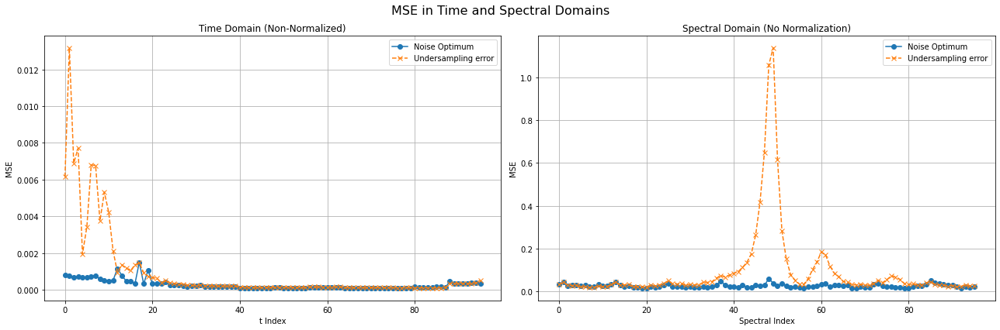

==== Model Output vs Ground Truth ====
Total MSE in image domain: 0.00013944022551489374
Normalized Total MSE in image domain: 0.0001609174825466368
Total MSE in spectral domain: 0.013386262055325476

==== Model Input vs Ground Truth ====
Total MSE in image domain: 0.0004820007405843592
Normalized Total MSE in image domain: 0.0005517798302682964
Total MSE in spectral domain: 0.04627207109609848


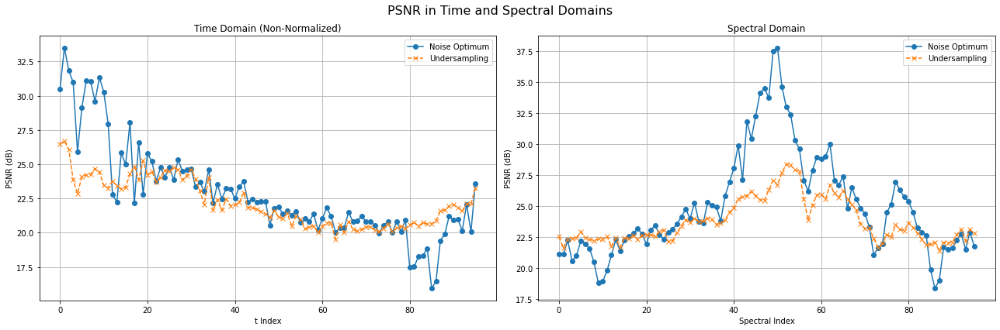

==== Model Output vs. Ground Truth ====
Average PSNR in image domain:    22.922073364257812
Average PSNR in frequency domain: 24.99574882784428

==== Model Input vs. Ground Truth ====
Average PSNR in image domain:    22.21731339271673
Average PSNR in frequency domain: 23.765771163602334


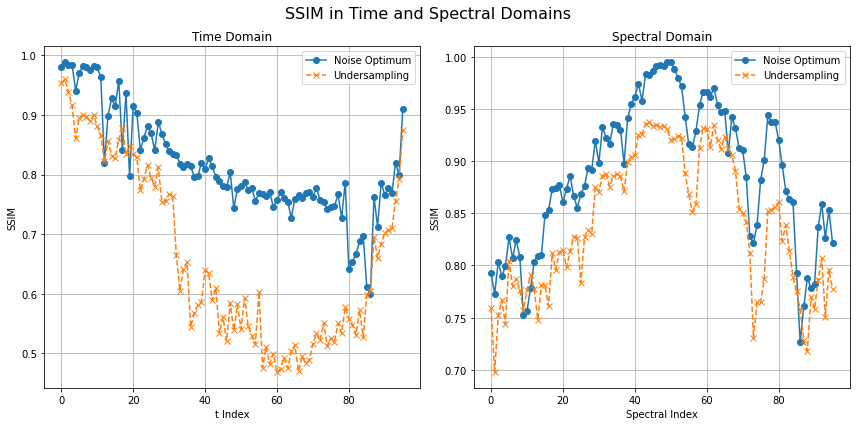

==== Model Output vs. Ground Truth ====
Average SSIM in image domain:    0.8139291977498191
Average SSIM in frequency domain: 0.8879169642804959

==== Model Input vs. Ground Truth ====
Average SSIM in image domain:    0.6637691715760501
Average SSIM in frequency domain: 0.8395191597014691


In [5]:
label = "Noise Optimum"

_, _, norm_values_test = normalize_data_per_image_new(Ground_Truth_L8, Ground_Truth2_L8)

plot_general_statistics(Ground_Truth2_L8, Undersampled_Data_L8, Ground_Truth_L8, 96, norm_values_test, label, label2="Undersampling error")
plot_general_statistics_PSNR(Ground_Truth2_L8, Undersampled_Data_L8, Ground_Truth_L8, 96, norm_values_test, label, label2="Undersampling")
plot_general_statistics_SSIM(Ground_Truth2_L8, Undersampled_Data_L8, Ground_Truth_L8, 96, norm_values_test, label, label2="Undersampling")

Optimal statistics

In [6]:
# label = "GT + noise"

# tf = 50 # 50 = water, 60 = Glc, 78 = Glx
# T = 7

# Ground_Truth2_L8_swapped = np.swapaxes(Ground_Truth2_L8, 0, 2)
# Ground_Truth_L8_swapped = np.swapaxes(Ground_Truth_L8, 0, 2)
# Undersampled_Data_L8_swapped = np.swapaxes(Undersampled_Data_L8, 0, 2)

# comparison_Plot_3D_vs_Ifft(Ground_Truth2_L8_swapped, Ground_Truth_L8_swapped, Undersampled_Data_L8_swapped, tf, T, domain="spectral", label = label, label2 = "undersampled + LR8", label3="Ground Truth", fixed_scale = True)

In [7]:
# label = "GT + noise"

# t = 1 # 50 = water, 60 = Glc, 78 = Glx
# T = 7

# Ground_Truth2_L8_swapped = np.swapaxes(Ground_Truth2_L8, 0, 2)
# Ground_Truth_L8_swapped = np.swapaxes(Ground_Truth_L8, 0, 2)
# Undersampled_Data_L8_swapped = np.swapaxes(Undersampled_Data_L8, 0, 2)

# comparison_Plot_3D_vs_Ifft(Ground_Truth2_L8_swapped, Ground_Truth_L8_swapped, Undersampled_Data_L8_swapped, t, T, domain="time", label = label, label2 = "undersampled + LR8", label3="Ground Truth", fixed_scale = True)

In [8]:
# Patient = 0
# x, y, T = 10, 10, 7

# indices = range(6, 15) 
# num_rows = len(indices)
# num_cols = 2  # left column: arr1 vs arr2; right column: arr3 vs arr4
# # Create a figure and a grid of subplots
# fig, axs = plt.subplots(num_rows, num_cols, figsize=(20, num_rows * 4), sharex=True)

# # If there's only one row, axs may not be 2D, so ensure we have a 2D array:
# if num_rows == 1:
#     axs = np.array([axs])

# for i, idx in enumerate(indices):
#     # Left subplot: compare arr1 and arr2
#     ax_left = axs[i, 0]
#     ax_left.plot(np.abs(Ground_Truth_Spectral[x, y, idx, :, T]), label="Fully Sampled", color='blue')
#     ax_left.plot(np.abs(Ground_Truth_2_Spectral[x, y, idx, :, T]), label="Fully Sampled 2", color='orange')
#     ax_left.plot(np.abs(Undersampled_Data_Spectral[x, y, idx, :, T]), label=f"Undersampled Regular", color='green')
#     ax_left.set_title(f" z = {idx}")
#     ax_left.legend()
#     ax_left.legend(loc="upper left")
    
#     # Right subplot: compare arr3 and arr4
#     ax_right = axs[i, 1]
#     ax_right.plot(np.abs(Ground_Truth_Spectral_L8[x, y, idx, :, T]), label="Fully Sampled + LR 8", color='blue')
#     ax_right.plot(np.abs(Ground_Truth_2_Spectral_L8[x, y, idx, :, T]), label="Fully Sampled 2 + LR 8", color='orange')
#     ax_right.plot(np.abs(Undersampled_Data_Spectral_L8[x, y, idx, :, T]), label="Undersampled + LR 8", color='green')
#     ax_right.set_title(f" z = {idx}")
#     ax_right.legend()
#     ax_right.legend(loc="upper left")

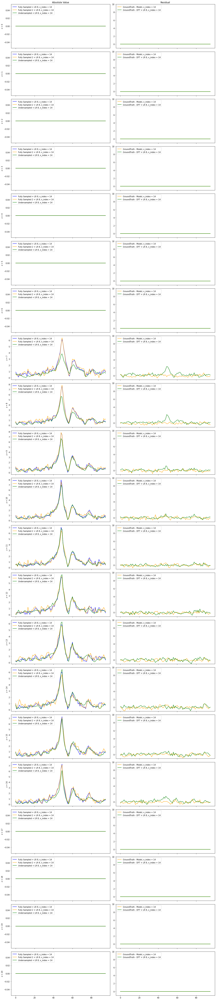

===================Next x index===========================


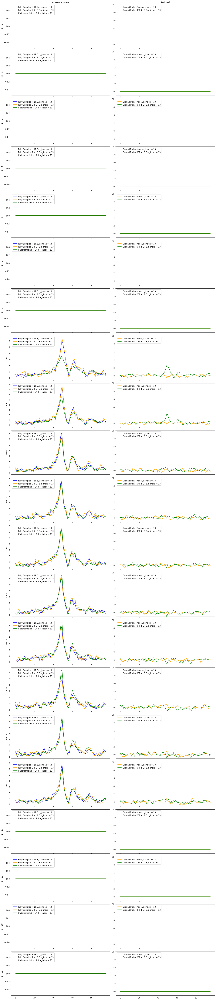

===================Next x index===========================


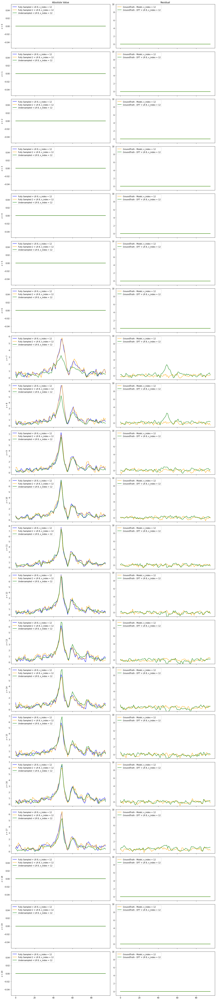

===================Next x index===========================


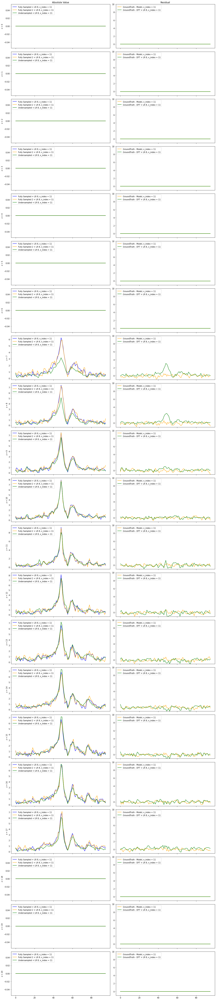

===================Next x index===========================


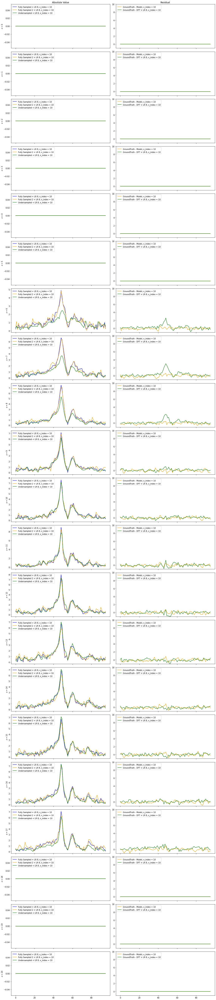

===================Next x index===========================


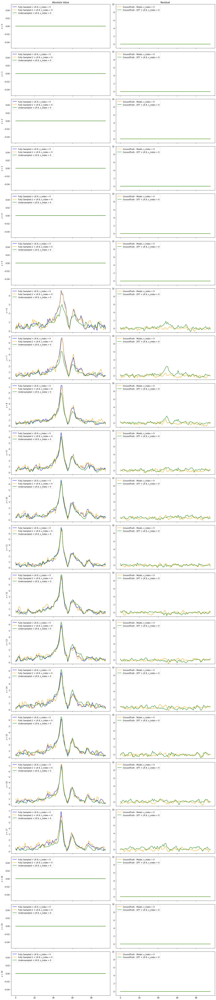

===================Next x index===========================


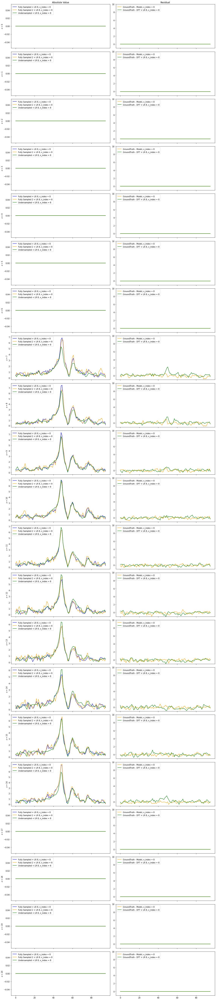

===================Next x index===========================


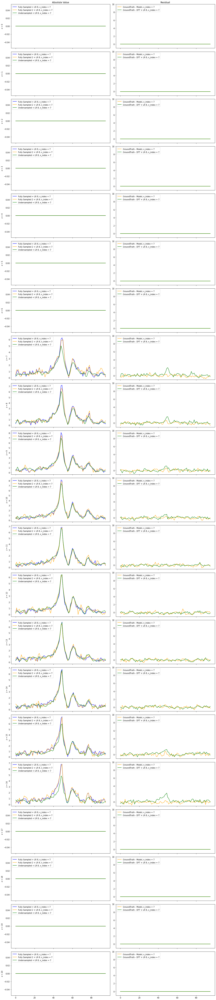

===================Next x index===========================


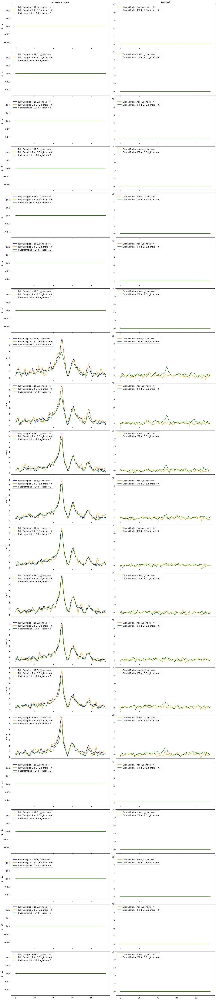

===================Next x index===========================


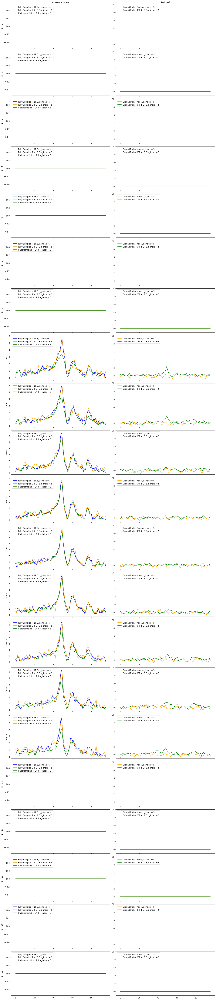

===================Next x index===========================


In [9]:
# ground_truth_spectral = np.fft.fftshift(np.fft.fft(ground_truth, axis=-2), axes=-2)
# model_pred_spectral = np.fft.fftshift(np.fft.fft(Model_Outputs_Test_Set, axis=-2), axes=-2)
# IFF_LR_8 = np.fft.fftshift(np.fft.fft(model_input, axis=-2), axes=-2)

# IFF_LR_8 = np.fft.fftshift(np.fft.fft(model_input, axis=-2), axes=-2)
# Fixed indices for x, y, and T:
# ----------------------------------------------------------------------
# Fixed indices for x, y, and T
# 10
for x_fixed in range(14, 4, -1):
    #x_fixed = 10
    y_fixed = 10
    T_fixed = 7

    num_z = 21  # Number of z slices

    # ----------------------------------------------------------------------
    # Create a figure with 2 columns:
    #   Column 1 -> Absolute value plots
    #   Column 2 -> Residuals (GT - [Others])
    # ----------------------------------------------------------------------
    fig, axes = plt.subplots(nrows=num_z, ncols=2, figsize=(16, num_z * 3.5), sharex=True)

    # If there's only one row, ensure axes is 2D
    if num_z == 1:
        axes = np.array([axes])

    for z in range(num_z):
        # Extract the spectra at [x_fixed, y_fixed, z, :, T_fixed]
        gt_spec  = Ground_Truth_Spectral_L8[x_fixed, y_fixed, z, :, T_fixed]
        mp_spec  = Ground_Truth_2_Spectral_L8[x_fixed, y_fixed, z, :, T_fixed]
        iff_spec = Undersampled_Data_Spectral_L8[x_fixed, y_fixed, z, :, T_fixed]

        # ------------------------------------------------------------------
        # Column 1: Plot absolute spectra
        # ------------------------------------------------------------------
        ax_abs = axes[z, 0]
        ax_abs.plot(np.abs(gt_spec),  label=f'Fully Sampled + LR 8, x_index = {x_fixed}',    color='blue')
        ax_abs.plot(np.abs(mp_spec),  label=f'Fully Sampled 2 + LR 8, x_index = {x_fixed}',color='orange')
        ax_abs.plot(np.abs(iff_spec), label=f'Undersampled + LR 8, x_index = {x_fixed}',     color='green')
        #ax_abs.set_ylim(-1, 10)
        # Row label on the Y-axis
        ax_abs.set_ylabel(f'z = {z}')

        if z == 0:
            ax_abs.set_title('Absolute Value')
        ax_abs.legend(loc='upper left')

        # ------------------------------------------------------------------
        # Column 2: Plot residuals (Ground Truth - [Others])
        # ------------------------------------------------------------------
        ax_res = axes[z, 1]

        residual_gt_mp  = np.abs(gt_spec) - np.abs(mp_spec)
        residual_gt_iff = np.abs(gt_spec) - np.abs(iff_spec)

        ax_res.plot(residual_gt_mp,  label=f'GroundTruth - Model, x_index = {x_fixed}',        color='orange')
        ax_res.plot(residual_gt_iff, label=f'GroundTruth - DFT + LR 8, x_index = {x_fixed}',  color='green')

        if z == 0:
            ax_res.set_title('Residual')
        ax_res.legend(loc='upper left')
        ax_res.set_ylim(-1, 10)
        
    plt.tight_layout()
    plt.show()
    print('===================Next x index===========================')

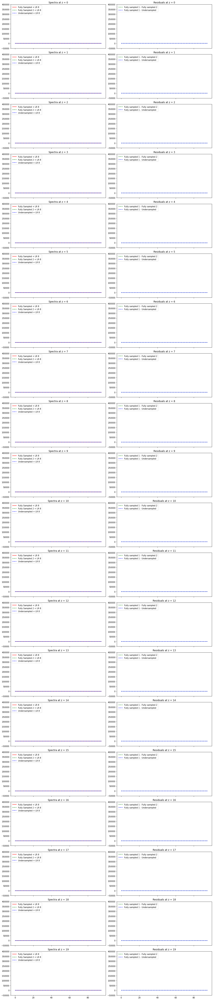

In [10]:
import numpy as np
import matplotlib.pyplot as plt

x, y, T = 10, 15, 7

indices = range(0, 20) 
num_rows = len(indices)
num_cols = 2  # First column for spectra, second for residuals

# Create a figure and a grid of subplots
fig, axs = plt.subplots(num_rows, num_cols, figsize=(15, num_rows * 3.5), sharex=True)

# Ensure axs is always a 2D array
if num_rows == 1:
    axs = np.array([axs])

for i, idx in enumerate(indices):
    # Left subplot: compare original spectra
    ax_left = axs[i, 0]  # First column
    spectrum_fs1 = np.abs(Ground_Truth_Spectral_L8[x, y, idx, :, T])
    spectrum_fs2 = np.abs(Ground_Truth_2_Spectral_L8[x, y, idx, :, T])
    spectrum_us = np.abs(Undersampled_Data_Spectral_L8[x, y, idx, :, T])

    ax_left.plot(spectrum_fs1, label="Fully Sampled + LR 8", color='red')
    ax_left.plot(spectrum_fs2, label="Fully Sampled 2 + LR 8", color='green', linestyle='--')
    ax_left.plot(spectrum_us, label="Undersampled + LR 8", color='blue', linestyle='--')
    ax_left.set_title(f"Spectra at z = {idx}")
    ax_left.legend(loc="upper left")
    ax_left.set_ylim(-50000, 400000)  # Fixed y-axis range

    # Right subplot: residuals
    ax_right = axs[i, 1]  # Second column
    residual_fs1_fs2 = spectrum_fs1 - spectrum_fs2
    residual_fs1_us = spectrum_fs1 - spectrum_us

    ax_right.plot(residual_fs1_fs2, label="Fully sampled 1 - Fully sampled 2", color='green', linestyle='--')
    ax_right.plot(residual_fs1_us, label="Fully sampled 1 - Undersampled", color='blue', linestyle='--')
    ax_right.set_title(f"Residuals at z = {idx}")
    ax_right.legend(loc="upper left")
    ax_right.set_ylim(-50000, 400000)  # Fixed y-axis range

# Adjust layout for better spacing
plt.tight_layout()
plt.show()

In [11]:
extra = 400

Ground_Truth2_L8_interpolated = np.zeros((22,22,21,extra,8))*1J
Ground_Truth2_L8_interpolated[:,:,:,:96,:] = Ground_Truth2_L8

Ground_Truth_L8_interpolated = np.zeros((22,22,21,extra,8))*1J
Ground_Truth_L8_interpolated[:,:,:,:96,:] = Ground_Truth_L8

Undersampled_Data_L8_interpolated = np.zeros((22,22,21,extra,8))*1J
Undersampled_Data_L8_interpolated[:,:,:,:96,:] = Undersampled_Data_L8

Ground_Truth_2_Spectral_L8 = np.fft.fftshift(np.fft.fft(Ground_Truth2_L8_interpolated, axis=-2),axes=-2)
Ground_Truth_Spectral_L8 = np.fft.fftshift(np.fft.fft(Ground_Truth_L8_interpolated, axis=-2),axes=-2)
Undersampled_Data_Spectral_L8 = np.fft.fftshift(np.fft.fft(Undersampled_Data_L8_interpolated, axis=-2),axes=-2)


In [12]:
Ground_Truth_2_Spectral = np.fft.fftshift(np.fft.fft(Ground_Truth2, axis=-2),axes=-2)
Ground_Truth_2_Spectral_L8 = np.fft.fftshift(np.fft.fft(Ground_Truth2_L8, axis=-2),axes=-2)
Ground_Truth_Spectral = np.fft.fftshift(np.fft.fft(Ground_Truth, axis=-2),axes=-2)
Ground_Truth_Spectral_L8 = np.fft.fftshift(np.fft.fft(Ground_Truth_L8, axis=-2),axes=-2)

Undersampled_Data_Spectral = np.fft.fftshift(np.fft.fft(Undersampled_Data, axis=-2),axes=-2)
Undersampled_Data_Spectral_L8 = np.fft.fftshift(np.fft.fft(Undersampled_Data_L8, axis=-2),axes=-2)

# ***Investigate different time steps - T***
Here I check if there is something to learn at AF = 3 for later timesteps T

In [13]:
# #### Define Input Data path
# GM_mask = np.load("../data/fn_vb_DMI_CRT_P08/GM_mask.npy")
# GM_mask = GM_mask[:,:,:,np.newaxis,np.newaxis]

# WM_mask = np.load("../data/fn_vb_DMI_CRT_P08/WM_mask.npy")
# WM_mask = WM_mask[:,:,:,np.newaxis,np.newaxis]

# Patient = 2

# mask = np.load('../data/masks.npy')
# mask_5 = mask[:,:,:,Patient]
# mask_5D = mask_5[:,:,:, np.newaxis, np.newaxis]

# ### Load data and tracuate
# Ground_Truth = np.load('../data/Ground_Truth/Full_Rank/P03-P08_truncated_k_space.npy')  #combined_trancuated_k_space_low_rank_15

# #### Generate noise
# noise = np.concatenate([Ground_Truth[:,:,:,66:,:,1], Ground_Truth[:,:,:,66:,:,2], Ground_Truth[:,:,:,66:,:,3], Ground_Truth[:,:,:,90:,:,4]], axis=3)  
# axis_to_shuffle = 3
# shuffled_indices = np.random.permutation(noise.shape[axis_to_shuffle])
# noise = np.take(noise, shuffled_indices, axis=axis_to_shuffle)

# #####
# Ground_Truth = Ground_Truth[...,Patient]
# Ground_Truth_L8 = low_rank(Ground_Truth, 8)*mask_5D*WM_mask
# #####

# Ground_Truth2 = Ground_Truth_L8 + noise
# Ground_Truth2_L8 = low_rank(Ground_Truth2, 8)*mask_5D*WM_mask

# ### Load undersampled data and trancuate
# Undersampled_Data = np.load("../data/Undersampled_Data/"+Undersampling+f'/AF_{AF}/'+Sampling_Mask+'/data.npy')[...,Patient]
# Undersampled_Data_L8 = low_rank(Undersampled_Data, 8)*mask_5D*WM_mask
# #### extract noise, add it to ground truth to create noise equivalent ground truth

# Ground_Truth_2_Spectral = np.fft.fftshift(np.fft.fft(Ground_Truth2, axis=-2),axes=-2)
# Ground_Truth_2_Spectral_L8 = np.fft.fftshift(np.fft.fft(Ground_Truth2_L8, axis=-2),axes=-2)
# Ground_Truth_Spectral = np.fft.fftshift(np.fft.fft(Ground_Truth, axis=-2),axes=-2)
# Ground_Truth_Spectral_L8 = np.fft.fftshift(np.fft.fft(Ground_Truth_L8, axis=-2),axes=-2)

# Undersampled_Data_Spectral = np.fft.fftshift(np.fft.fft(Undersampled_Data, axis=-2),axes=-2)
# Undersampled_Data_Spectral_L8 = np.fft.fftshift(np.fft.fft(Undersampled_Data_L8, axis=-2),axes=-2)

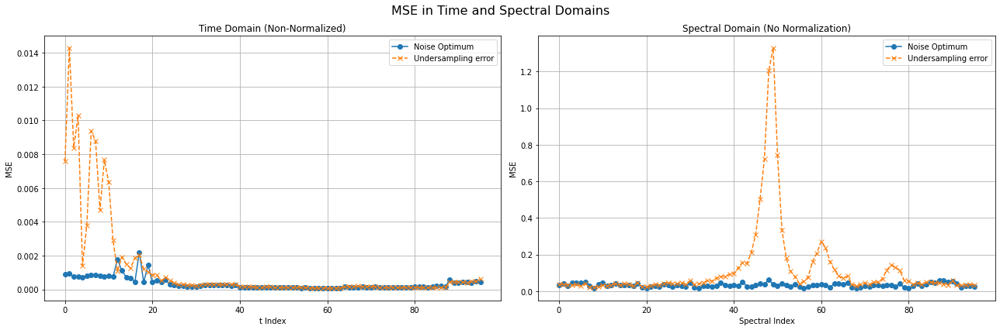

==== Model Output vs Ground Truth ====
Total MSE in image domain: 0.00017285570114230117
Normalized Total MSE in image domain: 0.001613753532780109
Total MSE in spectral domain: 0.0165941483123888

==== Model Input vs Ground Truth ====
Total MSE in image domain: 0.0005978940672822027
Normalized Total MSE in image domain: 0.005581844270255209
Total MSE in spectral domain: 0.05739783045909142


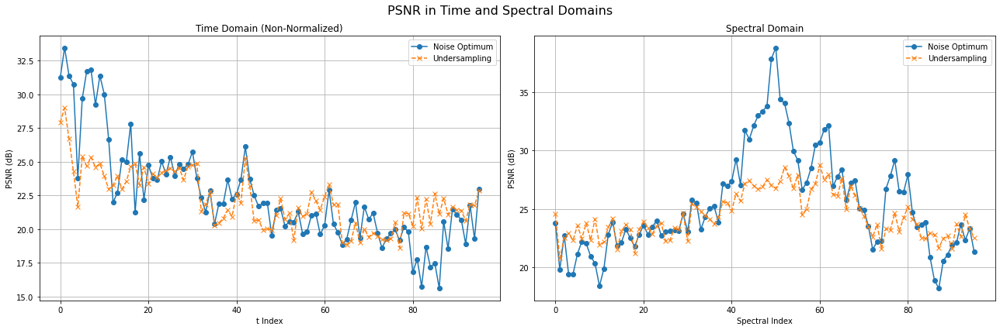

==== Model Output vs. Ground Truth ====
Average PSNR in image domain:    22.519447326660156
Average PSNR in frequency domain: 25.3701176853457

==== Model Input vs. Ground Truth ====
Average PSNR in image domain:    22.18134335052299
Average PSNR in frequency domain: 24.38978151646046


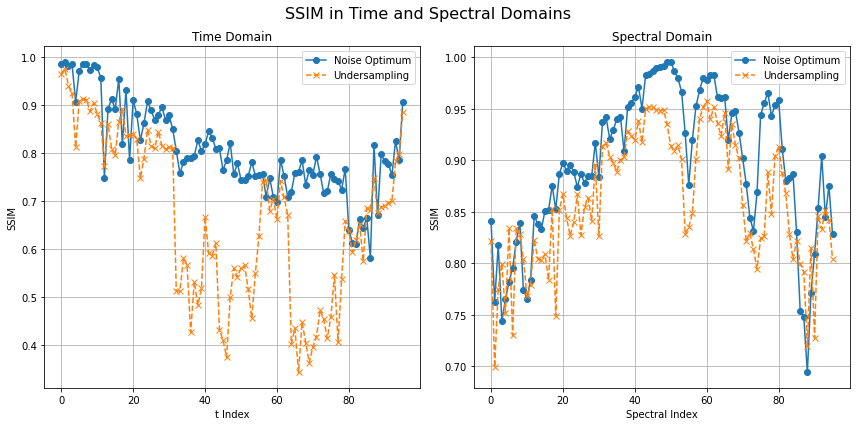

==== Model Output vs. Ground Truth ====
Average SSIM in image domain:    0.8066116023213669
Average SSIM in frequency domain: 0.8955186350254252

==== Model Input vs. Ground Truth ====
Average SSIM in image domain:    0.6660075833965614
Average SSIM in frequency domain: 0.860815164692896


In [14]:
T = 7
label = "Noise Optimum"

_, _, norm_values_test = normalize_data_per_image_new(Ground_Truth_L8, Ground_Truth2_L8)

Ground_Truth2_L8_T = Ground_Truth2_L8[:,:,:,:,T]
Undersampled_Data_L8_T = Undersampled_Data_L8[:,:,:,:,T]
Ground_Truth_L8_T = Ground_Truth_L8[:,:,:,:,T]

Ground_Truth2_L8_T = Ground_Truth2_L8_T[..., np.newaxis]
Undersampled_Data_L8_T = Undersampled_Data_L8_T[..., np.newaxis]
Ground_Truth_L8_T = Ground_Truth_L8_T[..., np.newaxis]

plot_general_statistics(Ground_Truth2_L8_T, Undersampled_Data_L8_T, Ground_Truth_L8_T, 96, norm_values_test, label, label2="Undersampling error")
plot_general_statistics_PSNR(Ground_Truth2_L8_T, Undersampled_Data_L8_T, Ground_Truth_L8_T, 96, norm_values_test, label, label2="Undersampling")
plot_general_statistics_SSIM(Ground_Truth2_L8_T, Undersampled_Data_L8_T, Ground_Truth_L8_T, 96, norm_values_test, label, label2="Undersampling")